# End-to-End Twitter Turkish Sentiment Analysis Application
## 3-Word Cloud



### Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/MyDrive/morethan101/')

### Install Packages

In [ ]:
!pip install nltk
!pip install emot==3.1

### Import Packages

In [ ]:
import nltk
nltk.download(['punkt', 'stopwords'])

In [5]:
import pandas as pd
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt

### Load Data

In [6]:
STOPWORDS_FILEPATH = "data/stopwords_tr.txt"
#SAVE_WORD_CLOUD_FILEPATH = "data/deprem_hashtag_subat_2023_{0}_wordcloud_freq.png"
SAVE_WORD_CLOUD_FILEPATH = "data/chatgpt_2022-11-30_2022-12-30_{0}_wordcloud_freq.png"

In [7]:
df = pd.read_csv('data/chatgpt_2022-11-30_2022-12-30_unique.csv')
df

,Unnamed: 0,ID,Date,Username,Tweet,ReplyCount,RetweetCount,LikeCount,QuoteCount,URL,OnlyDate
0,0,1608613358500220928,2022-12-29 23:58:05+00:00,ademmcansiz,ChatGPT ile vs atıyoruz olmuyor diyom hala anl...,0,0,3,0,https://twitter.com/ademmcansiz/status/1608613...,2022-12-29
1,1,1608585229756936192,2022-12-29 22:06:19+00:00,berkelevent,ChatGPT çıktı çıkalı Co-pilot’u da unuttuk..,0,0,0,0,https://twitter.com/berkelevent/status/1608585...,2022-12-29
2,2,1608581500060205057,2022-12-29 21:51:30+00:00,0xugurcaneser,Her türlü yazı işlerimi chatgpt yapıyor sağols...,0,0,0,0,https://twitter.com/0xugurcaneser/status/16085...,2022-12-29
3,3,1608580588247871488,2022-12-29 21:47:52+00:00,atiorh,@imTolstoyevski 2019 Haziran bölümlerinde yapa...,0,1,0,0,https://twitter.com/atiorh/status/160858058824...,2022-12-29
4,4,1608579005657272320,2022-12-29 21:41:35+00:00,nounpackage,Ben en güzel Siber Güvenlik muhabbetini ChatGP...,0,0,0,0,https://twitter.com/nounpackage/status/1608579...,2022-12-29
...,...,...,...,...,...,...,...,...,...,...,...
5578,5584,1598294973857792000,2022-12-01 12:36:31+00:00,DigitalReportTR,OpenAI’ın yeni chat robotu ChatGPT tanıtıldı\n...,0,1,1,0,https://twitter.com/DigitalReportTR/status/159...,2022-12-01
5579,5585,1598294149585047558,2022-12-01 12:33:14+00:00,venividi_trade,Yapay zeka üzerine araştırmalar yapan @OpenAI ...,5,3,14,1,https://twitter.com/venividi_trade/status/1598...,2022-12-01
5580,5586,1598293316843737088,2022-12-01 12:29:56+00:00,yigitkonur,Bugün mutlu musunuz? Biraz daha depresif hisse...,10,24,319,7,https://twitter.com/yigitkonur/status/15982933...,2022-12-01
5581,5587,1598288040052502528,2022-12-01 12:08:58+00:00,kisalar,Öykülerin tam da oturmuyor olmasının sebebi be...,1,0,0,0,https://twitter.com/kisalar/status/15982880400...,2022-12-01


In [15]:
df_positive = pd.read_csv('data/chatgpt_2022-11-30_2022-12-30_positive.csv')
df_positive

,Unnamed: 0,Unnamed: 0.1,ID,Date,Username,Tweet,ReplyCount,RetweetCount,LikeCount,QuoteCount,URL,OnlyDate,sentiment_label,sentiment_score
0,0,0,1608613358500220928,2022-12-29 23:58:05+00:00,ademmcansiz,ChatGPT ile vs atıyoruz olmuyor diyom hala anl...,0,0,3,0,https://twitter.com/ademmcansiz/status/1608613...,2022-12-29,positive,0.8235
1,1,1,1608585229756936192,2022-12-29 22:06:19+00:00,berkelevent,ChatGPT çıktı çıkalı Co-pilot’u da unuttuk..,0,0,0,0,https://twitter.com/berkelevent/status/1608585...,2022-12-29,positive,0.5480
2,4,4,1608579005657272320,2022-12-29 21:41:35+00:00,nounpackage,Ben en güzel Siber Güvenlik muhabbetini ChatGP...,0,0,0,0,https://twitter.com/nounpackage/status/1608579...,2022-12-29,positive,0.9589
3,5,5,1608577851284156416,2022-12-29 21:37:00+00:00,BetulGymn,@dunyadanfinans https://t.co/v08AOyT0T7 Yerli ...,2,3,4,1,https://twitter.com/BetulGymn/status/160857785...,2022-12-29,positive,0.9945
4,6,6,1608577733147381760,2022-12-29 21:36:32+00:00,BetulGymn,@dunyadanfinans @mizahdesen https://t.co/v08AO...,0,0,10,0,https://twitter.com/BetulGymn/status/160857773...,2022-12-29,positive,0.9889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3450,5578,5584,1598294973857792000,2022-12-01 12:36:31+00:00,DigitalReportTR,OpenAI’ın yeni chat robotu ChatGPT tanıtıldı\n...,0,1,1,0,https://twitter.com/DigitalReportTR/status/159...,2022-12-01,positive,0.7625
3451,5579,5585,1598294149585047558,2022-12-01 12:33:14+00:00,venividi_trade,Yapay zeka üzerine araştırmalar yapan @OpenAI ...,5,3,14,1,https://twitter.com/venividi_trade/status/1598...,2022-12-01,positive,0.7511
3452,5580,5586,1598293316843737088,2022-12-01 12:29:56+00:00,yigitkonur,Bugün mutlu musunuz? Biraz daha depresif hisse...,10,24,319,7,https://twitter.com/yigitkonur/status/15982933...,2022-12-01,positive,0.9908
3453,5581,5587,1598288040052502528,2022-12-01 12:08:58+00:00,kisalar,Öykülerin tam da oturmuyor olmasının sebebi be...,1,0,0,0,https://twitter.com/kisalar/status/15982880400...,2022-12-01,positive,0.6335


In [16]:
df_negative = pd.read_csv('data/chatgpt_2022-11-30_2022-12-30_negative.csv')
df_negative

,Unnamed: 0,Unnamed: 0.1,ID,Date,Username,Tweet,ReplyCount,RetweetCount,LikeCount,QuoteCount,URL,OnlyDate,sentiment_label,sentiment_score
0,2,2,1608581500060205057,2022-12-29 21:51:30+00:00,0xugurcaneser,Her türlü yazı işlerimi chatgpt yapıyor sağols...,0,0,0,0,https://twitter.com/0xugurcaneser/status/16085...,2022-12-29,negative,0.8703
1,3,3,1608580588247871488,2022-12-29 21:47:52+00:00,atiorh,@imTolstoyevski 2019 Haziran bölümlerinde yapa...,0,1,0,0,https://twitter.com/atiorh/status/160858058824...,2022-12-29,negative,0.7501
2,7,7,1608576320002478081,2022-12-29 21:30:55+00:00,hey_uren,@dc_boyblue @hellstabber -Konuşmaya dahil oldu...,0,0,0,0,https://twitter.com/hey_uren/status/1608576320...,2022-12-29,negative,0.9990
3,8,8,1608576028284448781,2022-12-29 21:29:45+00:00,elfsensoz,ChatGPT ile asla ama asla adam asmaca oynamayın.,1,0,2,0,https://twitter.com/elfsensoz/status/160857602...,2022-12-29,negative,0.9975
4,11,11,1608567682491895808,2022-12-29 20:56:35+00:00,instayikapatti1,ChatGPT’nin saniyeler icerisinde istedigim kod...,0,0,0,0,https://twitter.com/instayikapatti1/status/160...,2022-12-29,negative,0.8747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2123,5554,5560,1598582991571255296,2022-12-02 07:41:00+00:00,Mehmetoloji_,Meslek değiştirip yazılıma başlayan jr. Develo...,0,0,6,0,https://twitter.com/Mehmetoloji_/status/159858...,2022-12-02,negative,0.9892
2124,5570,5576,1598437869286309889,2022-12-01 22:04:20+00:00,MumiDemir,Bu chatgpt’nin gösterdiği gelişim inanılmaz fa...,0,0,0,0,https://twitter.com/MumiDemir/status/159843786...,2022-12-01,negative,0.9303
2125,5571,5577,1598434841120616451,2022-12-01 21:52:18+00:00,KadirTunaYeni,@AkyuzUluc Yeterince ses getirmedi ama daha et...,0,0,1,1,https://twitter.com/KadirTunaYeni/status/15984...,2022-12-01,negative,0.9855
2126,5574,5580,1598356172418990080,2022-12-01 16:39:42+00:00,hz_robot,OpenAI'nin en son yapay zeka(LM) uygulaması ol...,1,0,0,0,https://twitter.com/hz_robot/status/1598356172...,2022-12-01,negative,0.9983


In [17]:
print("total number: ",len(df))
print("positive number: ",len(df_positive))
print("negative number: ", len(df_negative))
print("\n")
print("% of positive: ",round(100*len(df_positive)/len(df),2))
print("% of negative: ",round(100*len(df_negative)/len(df),2))

total number:  5583
positive number:  3455
negative number:  2128


% of positive:  61.88
% of negative:  38.12


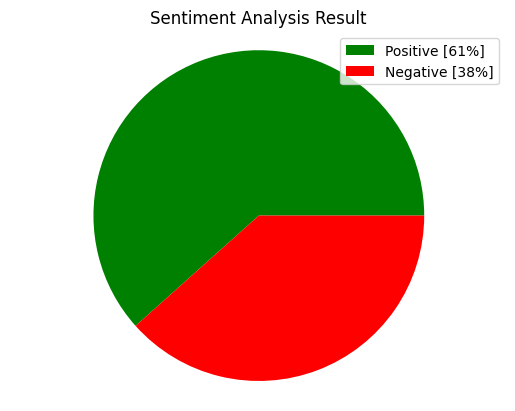

In [18]:
positive = int(100*len(df_positive)/len(df))
negative = int(100*len(df_negative)/len(df))

labels = [f'Positive [{str(positive)}%]',f'Negative [{str(negative)}%]']

sizes = [positive, negative]

colors = ['green', 'red']
patches, texts = plt.pie(sizes,colors=colors)

plt.style.use('default')
plt.legend(labels)
plt.title("Sentiment Analysis Result")
plt.axis("equal")
plt.show()

### Preprocess 

In [19]:
import re
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

In [20]:
def get_stopwords_list():
    s_words = []
    w_file = open(STOPWORDS_FILEPATH, encoding="utf-8")
    
    for word in w_file:
        s_words.append(word.strip()) 


    #stop_words.append("Yerli")

    w_file.close()

    return s_words

In [21]:
stop_words = get_stopwords_list()
len(stop_words)

620

In [22]:
def preprocess_word(word):
    # Remove punctuation
    word = word.strip('\'"?!,.():;``')
    
    # Convert more than 2 letter repetitions to 2 letter
    # funnnnny --> funny
    word = re.sub(r'(.)\1+', r'\1\1', word)
    # Remove - & '
    word = re.sub(r'(-|\')', '', word)
    return word


def is_valid_word(word):
    # Check if word begins with an alphabet
    return (re.search(r'^[a-zA-Z][a-z0-9A-Z\._]*$', word) is not None)


def handle_emojis(tweet):
    # Smile -- :), : ), :-), (:, ( :, (-:, :')
    tweet = re.sub(r'(:\s?\)|:-\)|\(\s?:|\(-:|:\'\))', ' EMO_POS ', tweet)
    # Laugh -- :D, : D, :-D, xD, x-D, XD, X-D
    tweet = re.sub(r'(:\s?D|:-D|x-?D|X-?D)', ' EMO_POS ', tweet)
    # Love -- <3, :*
    tweet = re.sub(r'(<3|:\*)', ' EMO_POS ', tweet)
    # Wink -- ;-), ;), ;-D, ;D, (;,  (-;
    tweet = re.sub(r'(;-?\)|;-?D|\(-?;)|😉', ' EMO_POS ', tweet)
    # Sad -- :-(, : (, :(, ):, )-:
    tweet = re.sub(r'(:\s?\(|:-\(|\)\s?:|\)-:)', ' EMO_NEG ', tweet)
    # Cry -- :,(, :'(, :"(
    tweet = re.sub(r'(:,\(|:\'\(|:"\()', ' EMO_NEG ', tweet)

    return tweet


def remove_emoji(string):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F" # emoticons
                           u"\U0001F300-\U0001F5FF" # symbols & pictographs
                           u"\U0001F680-\U0001F6FF" # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF" # flags (iOS)
                           u"\U00002500-\U00002BEF"  # chinese char
                           u"\U00002702-\U000027B0"
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           u"\U0001f926-\U0001f937"
                           u"\U00010000-\U0010ffff"
                           u"\u2640-\u2642"
                           u"\u2600-\u2B55"
                           u"\u200d"
                           u"\u23cf"
                           u"\u23e9"
                           u"\u231a"
                           u"\ufe0f"  # dingbats
                           u"\u3030"
                           "]+", flags=re.UNICODE)
    
    return emoji_pattern.sub(r'', string)


def preprocess_tweet(tweet):
    processed_tweet = []
    # Convert to lower case
    tweet = tweet.lower()
    
    #Clean only digits
    tweet = re.sub("^\d+\s|\s\d+\s|\s\d+$", " ", tweet)
    
    
    # Replaces URLs with the word URL
    #tweet = re.sub(r'((www\.[\S]+)|(https?://[\S]+))', ' URL ', tweet)
    tweet = re.sub(r'((www\.[\S]+)|(https?://[\S]+))', '', tweet)
    
    # Replace @handle with the word USER_MENTION
    #tweet = re.sub(r'@[\S]+', 'USER_MENTION', tweet)
    tweet = re.sub(r'@[\S]+', '', tweet)
    
    # Replaces #hashtag with hashtag
    #tweet = re.sub(r'#(\S+)', r' \1 ', tweet)
    tweet = re.sub(r'#(\S+)', '', tweet)
    
    # Remove RT (retweet)
    tweet = re.sub(r'\brt\b', '', tweet)
    
    # Replace 2+ dots with space
    tweet = re.sub(r'\.{2,}', ' ', tweet)
    
    # Strip space, " and ' from tweet
    tweet = tweet.strip(' "\'')

    # Replace emojis with either EMO_POS or EMO_NEG
    #tweet = handle_emojis(tweet)
    tweet = remove_emoji(tweet)
   
    # Replace multiple spaces with a single space
    tweet = re.sub(r'\s+', ' ', tweet)

    #my custom chars
    tweet = tweet.replace('₺','')
    tweet = tweet.replace('=','')
    tweet = tweet.replace('’','')
    tweet = tweet.replace('|','')
    tweet = tweet.replace('‘','')
    tweet = tweet.replace('/','')
    tweet = tweet.replace('…','')
    tweet = tweet.replace('–','')
    tweet = tweet.replace('&','')
    tweet = tweet.replace('“','')
    tweet = tweet.replace('”','')
    tweet = tweet.replace('+','')
    tweet = tweet.replace('%','')
    tweet = tweet.replace('@','')
    tweet = tweet.replace('#','')

    words = word_tokenize(tweet) #tweet.split()

    for word in words:
      word = preprocess_word(word)
      #if is_valid_word(word):
      #    processed_tweet.append(word)
      processed_tweet.append(word)

    return ' '.join(processed_tweet)

In [23]:
def generate_word_cloud(tweets, status):
    
    # adding movie script specific stopwords
    stop_words = get_stopwords_list()

    print(len(tweets))

    wordcloud = WordCloud(
        width=800, 
        height=400,
        background_color = 'black',
        stopwords = stop_words).generate(str(tweets))
    
    plt.figure( figsize=(20,10), facecolor='k')
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

    wordcloud.to_file(SAVE_WORD_CLOUD_FILEPATH.format(status))

### Generate Word Cloud

In [24]:
def generate_word_cloud_from_frequencies(freq_dict, status):
    
    # adding movie script specific stopwords
    stop_words = get_stopwords_list()

    #print(stop_words)

    print(len(fdist_filtered))

    wordcloud = WordCloud(
        width=800, 
        height=400,
        background_color = 'black',
        stopwords = stop_words).generate_from_frequencies(frequencies=freq_dict)
    
    plt.figure( figsize=(20,10), facecolor='k')
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()

    wordcloud.to_file(SAVE_WORD_CLOUD_FILEPATH.format(status))

## ALL

In [25]:
df.Tweet

0       ChatGPT ile vs atıyoruz olmuyor diyom hala anl...
1            ChatGPT çıktı çıkalı Co-pilot’u da unuttuk..
2       Her türlü yazı işlerimi chatgpt yapıyor sağols...
3       @imTolstoyevski 2019 Haziran bölümlerinde yapa...
4       Ben en güzel Siber Güvenlik muhabbetini ChatGP...
                              ...                        
5578    OpenAI’ın yeni chat robotu ChatGPT tanıtıldı\n...
5579    Yapay zeka üzerine araştırmalar yapan @OpenAI ...
5580    Bugün mutlu musunuz? Biraz daha depresif hisse...
5581    Öykülerin tam da oturmuyor olmasının sebebi be...
5582    Araba nasıl seyahat özgürlüğü verdiyse #YapayZ...
Name: Tweet, Length: 5583, dtype: object

In [26]:
df["Date"].values

array(['2022-12-29 23:58:05+00:00', '2022-12-29 22:06:19+00:00',
       '2022-12-29 21:51:30+00:00', ..., '2022-12-01 12:29:56+00:00',
       '2022-12-01 12:08:58+00:00', '2022-12-01 12:08:52+00:00'],
      dtype=object)

In [27]:
df['Date'].describe

<bound method NDFrame.describe of 0       2022-12-29 23:58:05+00:00
1       2022-12-29 22:06:19+00:00
2       2022-12-29 21:51:30+00:00
3       2022-12-29 21:47:52+00:00
4       2022-12-29 21:41:35+00:00
                  ...            
5578    2022-12-01 12:36:31+00:00
5579    2022-12-01 12:33:14+00:00
5580    2022-12-01 12:29:56+00:00
5581    2022-12-01 12:08:58+00:00
5582    2022-12-01 12:08:52+00:00
Name: Date, Length: 5583, dtype: object>

In [28]:
#df["created_at"].values

<AxesSubplot:>

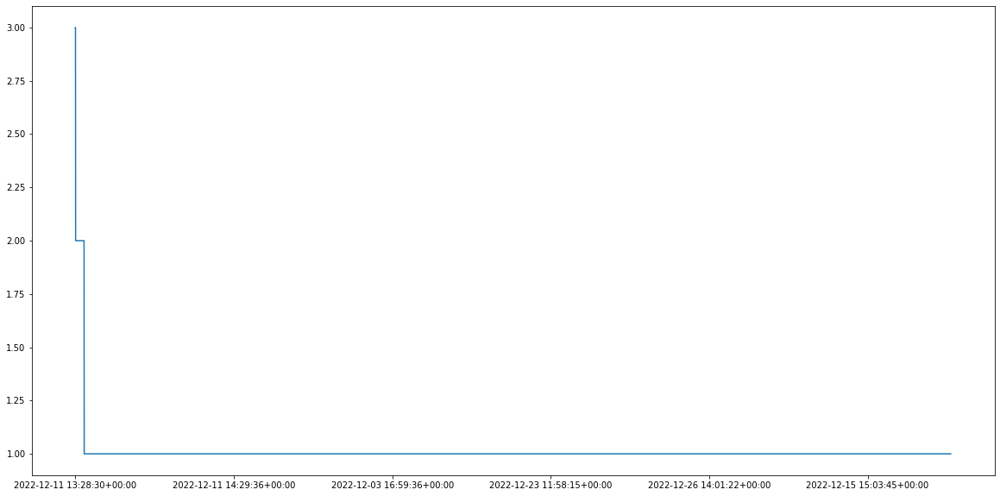

In [29]:
%matplotlib inline

df['Date'].value_counts().plot(figsize=(20,10))

In [30]:
[t for t in df.Tweet]

['ChatGPT ile vs atıyoruz olmuyor diyom hala anlamıyo ekrana kafa atıcam birazdan',
 'ChatGPT çıktı çıkalı Co-pilot’u da unuttuk..',
 'Her türlü yazı işlerimi chatgpt yapıyor sağolsun. Benim teknolojiden beklentim budur. Tembelliğime çanak tutsa yeter 😂',
 '@imTolstoyevski 2019 Haziran bölümlerinde yapay zekaya kısaca değinmiştiniz ama serinin odağı değildi ve o zamandan bu yana üstel gelişmeler oldu. ChatGPT’ye ödev yaptıran, Stable Diffusion ile sanal zaman yolculuğu yapanlar mesela. Bahsettiğiniz temaya tam uyduğunu düşünüyorum 🤔',
 "Ben en güzel Siber Güvenlik muhabbetini ChatGPT ile yaptım, bulamadığım bilgileri ve toolları buldum, kapatırken de teşekkür ettim. Nlp'ler de takdir edilmeli. 😁",
 '@dunyadanfinans https://t.co/v08AOyT0T7 Yerli bir Yapay Zeka uygulaması. ChatGPT , Dall-e , Stable gibi dünyanın en iyi yapay zeka modellerini tek bir platformdan sunuyor. Türkçe dilinde en iyi sonuçlar bu platformdan alınıyor 👍🏻',
 '@dunyadanfinans @mizahdesen https://t.co/v08AOyT0T7 Yerli

In [31]:
tweet_all_texts = " ".join(t for t in df.Tweet)
print("chatgpt twitlerinin tamamı {0} adet kelimeden oluşuyor".format(len(tweet_all_texts)))

chatgpt twitlerinin tamamı 786820 adet kelimeden oluşuyor


In [32]:
tweet_positive_texts = " ".join(t for t in df_positive.Tweet)
print("chatgpt pozitif twitlerinin tamamı {0} adet kelimeden oluşuyor".format(len(tweet_positive_texts)))

chatgpt pozitif twitlerinin tamamı 475096 adet kelimeden oluşuyor


In [33]:
tweet_negative_texts = " ".join(t for t in df_negative.Tweet)
print("chatgpt negatif twitlerinin tamamı {0} adet kelimeden oluşuyor".format(len(tweet_negative_texts)))

chatgpt negatif twitlerinin tamamı 311723 adet kelimeden oluşuyor


In [34]:
tweet_all_texts

'ChatGPT ile vs atıyoruz olmuyor diyom hala anlamıyo ekrana kafa atıcam birazdan ChatGPT çıktı çıkalı Co-pilot’u da unuttuk.. Her türlü yazı işlerimi chatgpt yapıyor sağolsun. Benim teknolojiden beklentim budur. Tembelliğime çanak tutsa yeter 😂 @imTolstoyevski 2019 Haziran bölümlerinde yapay zekaya kısaca değinmiştiniz ama serinin odağı değildi ve o zamandan bu yana üstel gelişmeler oldu. ChatGPT’ye ödev yaptıran, Stable Diffusion ile sanal zaman yolculuğu yapanlar mesela. Bahsettiğiniz temaya tam uyduğunu düşünüyorum 🤔 Ben en güzel Siber Güvenlik muhabbetini ChatGPT ile yaptım, bulamadığım bilgileri ve toolları buldum, kapatırken de teşekkür ettim. Nlp\'ler de takdir edilmeli. 😁 @dunyadanfinans https://t.co/v08AOyT0T7 Yerli bir Yapay Zeka uygulaması. ChatGPT , Dall-e , Stable gibi dünyanın en iyi yapay zeka modellerini tek bir platformdan sunuyor. Türkçe dilinde en iyi sonuçlar bu platformdan alınıyor 👍🏻 @dunyadanfinans @mizahdesen https://t.co/v08AOyT0T7 Yerli bir Yapay Zeka uygulama

### Tokenizer

In [35]:
token_words = word_tokenize(tweet_all_texts)
print(token_words)
print(len(token_words))

['ChatGPT', 'ile', 'vs', 'atıyoruz', 'olmuyor', 'diyom', 'hala', 'anlamıyo', 'ekrana', 'kafa', 'atıcam', 'birazdan', 'ChatGPT', 'çıktı', 'çıkalı', 'Co-pilot', '’', 'u', 'da', 'unuttuk', '..', 'Her', 'türlü', 'yazı', 'işlerimi', 'chatgpt', 'yapıyor', 'sağolsun', '.', 'Benim', 'teknolojiden', 'beklentim', 'budur', '.', 'Tembelliğime', 'çanak', 'tutsa', 'yeter', '😂', '@', 'imTolstoyevski', '2019', 'Haziran', 'bölümlerinde', 'yapay', 'zekaya', 'kısaca', 'değinmiştiniz', 'ama', 'serinin', 'odağı', 'değildi', 've', 'o', 'zamandan', 'bu', 'yana', 'üstel', 'gelişmeler', 'oldu', '.', 'ChatGPT', '’', 'ye', 'ödev', 'yaptıran', ',', 'Stable', 'Diffusion', 'ile', 'sanal', 'zaman', 'yolculuğu', 'yapanlar', 'mesela', '.', 'Bahsettiğiniz', 'temaya', 'tam', 'uyduğunu', 'düşünüyorum', '🤔', 'Ben', 'en', 'güzel', 'Siber', 'Güvenlik', 'muhabbetini', 'ChatGPT', 'ile', 'yaptım', ',', 'bulamadığım', 'bilgileri', 've', 'toolları', 'buldum', ',', 'kapatırken', 'de', 'teşekkür', 'ettim', '.', "Nlp'ler", 'de', 't

### Cleaner

In [36]:
tweet_all_texts_clean = preprocess_tweet(tweet_all_texts)
tweet_all_texts_clean

'chatgpt ile vs atıyoruz olmuyor diyom hala anlamıyo ekrana kafa atıcam birazdan chatgpt çıktı çıkalı copilotu da unuttuk her türlü yazı işlerimi chatgpt yapıyor sağolsun  benim teknolojiden beklentim budur  tembelliğime çanak tutsa yeter haziran bölümlerinde yapay zekaya kısaca değinmiştiniz ama serinin odağı değildi ve o zamandan bu yana üstel gelişmeler oldu  chatgptye ödev yaptıran  stable diffusion ile sanal zaman yolculuğu yapanlar mesela  bahsettiğiniz temaya tam uyduğunu düşünüyorum ben en güzel siber güvenlik muhabbetini chatgpt ile yaptım  bulamadığım bilgileri ve toolları buldum  kapatırken de teşekkür ettim  nlpler de takdir edilmeli  yerli bir yapay zeka uygulaması  chatgpt  dalle  stable gibi dünyanın en iyi yapay zeka modellerini tek bir platformdan sunuyor  türkçe dilinde en iyi sonuçlar bu platformdan alınıyor yerli bir yapay zeka uygulaması  chatgpt  dalle  stable gibi dünyanın en iyi yapay zeka modellerini tek bir platformdan sunuyor  türkçe dilinde en iyi sonuçlar b

In [37]:
txt = "yıl olmuş 2013 konya torku şeker, 5861 konyaspor fenerbahçeyi gözüne kestirdi "
preprocess_tweet(txt)

'yıl olmuş konya torku şeker  konyaspor fenerbahçeyi gözüne kestirdi'

In [39]:
token_words_clean = word_tokenize(tweet_all_texts_clean)
print(token_words_clean)
print(len(token_words_clean))

['chatgpt', 'ile', 'vs', 'atıyoruz', 'olmuyor', 'diyom', 'hala', 'anlamıyo', 'ekrana', 'kafa', 'atıcam', 'birazdan', 'chatgpt', 'çıktı', 'çıkalı', 'copilotu', 'da', 'unuttuk', 'her', 'türlü', 'yazı', 'işlerimi', 'chatgpt', 'yapıyor', 'sağolsun', 'benim', 'teknolojiden', 'beklentim', 'budur', 'tembelliğime', 'çanak', 'tutsa', 'yeter', 'haziran', 'bölümlerinde', 'yapay', 'zekaya', 'kısaca', 'değinmiştiniz', 'ama', 'serinin', 'odağı', 'değildi', 've', 'o', 'zamandan', 'bu', 'yana', 'üstel', 'gelişmeler', 'oldu', 'chatgptye', 'ödev', 'yaptıran', 'stable', 'diffusion', 'ile', 'sanal', 'zaman', 'yolculuğu', 'yapanlar', 'mesela', 'bahsettiğiniz', 'temaya', 'tam', 'uyduğunu', 'düşünüyorum', 'ben', 'en', 'güzel', 'siber', 'güvenlik', 'muhabbetini', 'chatgpt', 'ile', 'yaptım', 'bulamadığım', 'bilgileri', 've', 'toolları', 'buldum', 'kapatırken', 'de', 'teşekkür', 'ettim', 'nlpler', 'de', 'takdir', 'edilmeli', 'yerli', 'bir', 'yapay', 'zeka', 'uygulaması', 'chatgpt', 'dalle', 'stable', 'gibi', 'd

### Clean Stop Words

In [40]:
stop_words = set(get_stopwords_list())

token_words_clean_ = [w for w in token_words_clean if not w in stop_words and len(w)>1]
print(token_words_clean_)
print(len(token_words_clean_))

['chatgpt', 'vs', 'atıyoruz', 'olmuyor', 'diyom', 'anlamıyo', 'ekrana', 'kafa', 'atıcam', 'birazdan', 'chatgpt', 'çıkalı', 'copilotu', 'unuttuk', 'türlü', 'yazı', 'işlerimi', 'chatgpt', 'sağolsun', 'teknolojiden', 'beklentim', 'budur', 'tembelliğime', 'çanak', 'tutsa', 'yeter', 'haziran', 'bölümlerinde', 'yapay', 'zekaya', 'kısaca', 'değinmiştiniz', 'serinin', 'odağı', 'değildi', 'zamandan', 'yana', 'üstel', 'gelişmeler', 'chatgptye', 'ödev', 'yaptıran', 'stable', 'diffusion', 'sanal', 'zaman', 'yolculuğu', 'yapanlar', 'mesela', 'bahsettiğiniz', 'temaya', 'uyduğunu', 'düşünüyorum', 'siber', 'güvenlik', 'muhabbetini', 'chatgpt', 'yaptım', 'bulamadığım', 'bilgileri', 'toolları', 'buldum', 'kapatırken', 'ettim', 'nlpler', 'takdir', 'edilmeli', 'yerli', 'yapay', 'zeka', 'uygulaması', 'chatgpt', 'dalle', 'stable', 'dünyanın', 'yapay', 'zeka', 'modellerini', 'tek', 'platformdan', 'sunuyor', 'türkçe', 'dilinde', 'platformdan', 'alınıyor', 'yerli', 'yapay', 'zeka', 'uygulaması', 'chatgpt', 'da

### Words Frequency

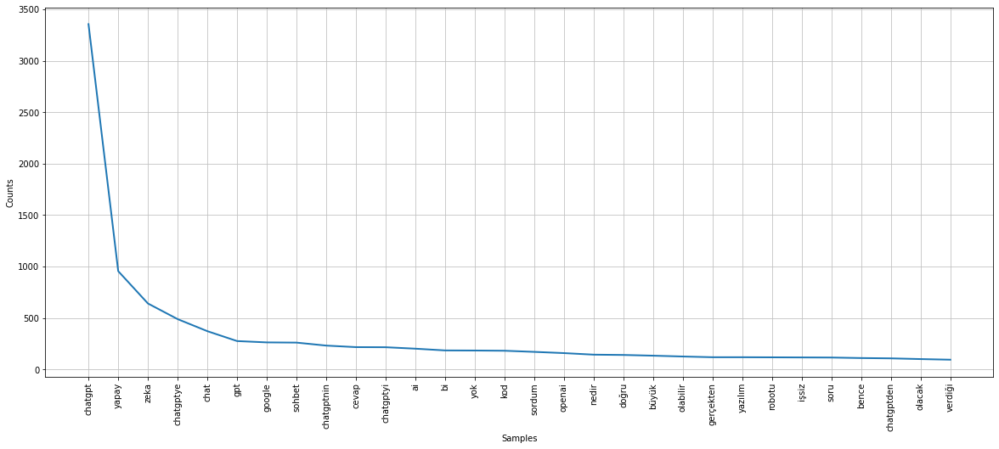

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [41]:
fdist_filtered = FreqDist(token_words_clean_)
#fdist_filtered.plot(30,title='Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
plt.figure(figsize=(20, 8))
fdist_filtered.plot(30)

In [42]:
from collections import Counter

d = Counter(fdist_filtered)
d.most_common(100)

[('chatgpt', 3355),
 ('yapay', 956),
 ('zeka', 642),
 ('chatgptye', 490),
 ('chat', 373),
 ('gpt', 277),
 ('google', 264),
 ('sohbet', 262),
 ('chatgptnin', 233),
 ('cevap', 218),
 ('chatgptyi', 217),
 ('ai', 203),
 ('bi', 186),
 ('yok', 185),
 ('kod', 183),
 ('sordum', 172),
 ('openai', 160),
 ('nedir', 145),
 ('doğru', 142),
 ('büyük', 135),
 ('olabilir', 127),
 ('gerçekten', 120),
 ('yazılım', 120),
 ('robotu', 119),
 ('işsiz', 118),
 ('soru', 117),
 ('bence', 112),
 ('chatgptden', 109),
 ('olacak', 102),
 ('verdiği', 96),
 ('insan', 95),
 ('veriyor', 94),
 ('abi', 93),
 ('zaman', 92),
 ('fazla', 88),
 ('dedim', 88),
 ('teknoloji', 88),
 ('tek', 87),
 ('bugün', 86),
 ('verdi', 86),
 ('istedim', 85),
 ('zekanın', 79),
 ('neler', 78),
 ('cevaplar', 77),
 ('sanırım', 76),
 ('bilgi', 75),
 ('türkçe', 74),
 ('merak', 73),
 ('inanılmaz', 72),
 ('yanlış', 71),
 ('yerini', 71),
 ('kodu', 70),
 ('yazıyor', 68),
 ('geldi', 66),
 ('geliyor', 66),
 ('googleın', 66),
 ('işi', 66),
 ('zekaya', 64

In [43]:
len(fdist_filtered)

21885

### Word Cloud

21885


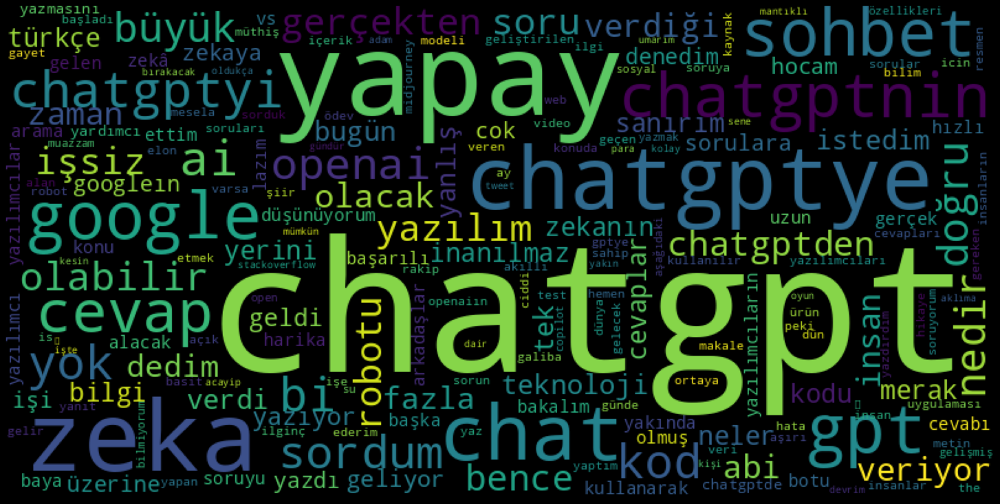

In [44]:
generate_word_cloud_from_frequencies(fdist_filtered, "all")

In [45]:
#generate_word_cloud(tweet_all_texts_clean, "all")

## POSITIVE
### Tokenizer

In [46]:
token_positive_words = word_tokenize(tweet_positive_texts)
print(token_positive_words)
print(len(token_positive_words))

['ChatGPT', 'ile', 'vs', 'atıyoruz', 'olmuyor', 'diyom', 'hala', 'anlamıyo', 'ekrana', 'kafa', 'atıcam', 'birazdan', 'ChatGPT', 'çıktı', 'çıkalı', 'Co-pilot', '’', 'u', 'da', 'unuttuk', '..', 'Ben', 'en', 'güzel', 'Siber', 'Güvenlik', 'muhabbetini', 'ChatGPT', 'ile', 'yaptım', ',', 'bulamadığım', 'bilgileri', 've', 'toolları', 'buldum', ',', 'kapatırken', 'de', 'teşekkür', 'ettim', '.', "Nlp'ler", 'de', 'takdir', 'edilmeli', '.', '😁', '@', 'dunyadanfinans', 'https', ':', '//t.co/v08AOyT0T7', 'Yerli', 'bir', 'Yapay', 'Zeka', 'uygulaması', '.', 'ChatGPT', ',', 'Dall-e', ',', 'Stable', 'gibi', 'dünyanın', 'en', 'iyi', 'yapay', 'zeka', 'modellerini', 'tek', 'bir', 'platformdan', 'sunuyor', '.', 'Türkçe', 'dilinde', 'en', 'iyi', 'sonuçlar', 'bu', 'platformdan', 'alınıyor', '👍🏻', '@', 'dunyadanfinans', '@', 'mizahdesen', 'https', ':', '//t.co/v08AOyT0T7', 'Yerli', 'bir', 'Yapay', 'Zeka', 'uygulaması', '.', 'ChatGPT', ',', 'Dall-e', ',', 'Stable', 'gibi', 'dünyanın', 'en', 'iyi', 'yapay', 'ze

### Cleaner

In [47]:
tweet_positive_texts_clean = preprocess_tweet(tweet_positive_texts)
tweet_positive_texts_clean

'chatgpt ile vs atıyoruz olmuyor diyom hala anlamıyo ekrana kafa atıcam birazdan chatgpt çıktı çıkalı copilotu da unuttuk ben en güzel siber güvenlik muhabbetini chatgpt ile yaptım  bulamadığım bilgileri ve toolları buldum  kapatırken de teşekkür ettim  nlpler de takdir edilmeli  yerli bir yapay zeka uygulaması  chatgpt  dalle  stable gibi dünyanın en iyi yapay zeka modellerini tek bir platformdan sunuyor  türkçe dilinde en iyi sonuçlar bu platformdan alınıyor yerli bir yapay zeka uygulaması  chatgpt  dalle  stable gibi dünyanın en iyi yapay zeka modellerini tek bir platformdan sunuyor  türkçe dilinde en iyi sonuçlar bu platformdan alınıyor yaratıcı chatgpt komutu chatgpt ve oyun programlama skillerimi kullanarak telegramda oynanan vampir köylü oyunu için rol tutma botumu başarıyla canlıya çıkarmış bulunmaktayım  chatgpt nedir  anlattıkları kadar mucizevi bir olay mı  profesör öğrencisini chatgpt i̇le kopya çekerken yakaladı  biliyor muydunuz  hallettim chatgpt sayesinde  öneririm herh

In [48]:
token_positive_words_clean = word_tokenize(tweet_positive_texts_clean)
print(token_positive_words_clean)
print(len(token_positive_words_clean))

['chatgpt', 'ile', 'vs', 'atıyoruz', 'olmuyor', 'diyom', 'hala', 'anlamıyo', 'ekrana', 'kafa', 'atıcam', 'birazdan', 'chatgpt', 'çıktı', 'çıkalı', 'copilotu', 'da', 'unuttuk', 'ben', 'en', 'güzel', 'siber', 'güvenlik', 'muhabbetini', 'chatgpt', 'ile', 'yaptım', 'bulamadığım', 'bilgileri', 've', 'toolları', 'buldum', 'kapatırken', 'de', 'teşekkür', 'ettim', 'nlpler', 'de', 'takdir', 'edilmeli', 'yerli', 'bir', 'yapay', 'zeka', 'uygulaması', 'chatgpt', 'dalle', 'stable', 'gibi', 'dünyanın', 'en', 'iyi', 'yapay', 'zeka', 'modellerini', 'tek', 'bir', 'platformdan', 'sunuyor', 'türkçe', 'dilinde', 'en', 'iyi', 'sonuçlar', 'bu', 'platformdan', 'alınıyor', 'yerli', 'bir', 'yapay', 'zeka', 'uygulaması', 'chatgpt', 'dalle', 'stable', 'gibi', 'dünyanın', 'en', 'iyi', 'yapay', 'zeka', 'modellerini', 'tek', 'bir', 'platformdan', 'sunuyor', 'türkçe', 'dilinde', 'en', 'iyi', 'sonuçlar', 'bu', 'platformdan', 'alınıyor', 'yaratıcı', 'chatgpt', 'komutu', 'chatgpt', 've', 'oyun', 'programlama', 'skiller

### Clean Stop Words

In [49]:
token_positive_words_clean_ = [w for w in token_positive_words_clean if not w in stop_words and len(w)>1]
print(token_positive_words_clean_)
print(len(token_positive_words_clean_))

['chatgpt', 'vs', 'atıyoruz', 'olmuyor', 'diyom', 'anlamıyo', 'ekrana', 'kafa', 'atıcam', 'birazdan', 'chatgpt', 'çıkalı', 'copilotu', 'unuttuk', 'siber', 'güvenlik', 'muhabbetini', 'chatgpt', 'yaptım', 'bulamadığım', 'bilgileri', 'toolları', 'buldum', 'kapatırken', 'ettim', 'nlpler', 'takdir', 'edilmeli', 'yerli', 'yapay', 'zeka', 'uygulaması', 'chatgpt', 'dalle', 'stable', 'dünyanın', 'yapay', 'zeka', 'modellerini', 'tek', 'platformdan', 'sunuyor', 'türkçe', 'dilinde', 'platformdan', 'alınıyor', 'yerli', 'yapay', 'zeka', 'uygulaması', 'chatgpt', 'dalle', 'stable', 'dünyanın', 'yapay', 'zeka', 'modellerini', 'tek', 'platformdan', 'sunuyor', 'türkçe', 'dilinde', 'platformdan', 'alınıyor', 'yaratıcı', 'chatgpt', 'komutu', 'chatgpt', 'oyun', 'programlama', 'skillerimi', 'kullanarak', 'telegramda', 'oynanan', 'vampir', 'köylü', 'oyunu', 'rol', 'tutma', 'botumu', 'başarıyla', 'canlıya', 'çıkarmış', 'bulunmaktayım', 'chatgpt', 'nedir', 'anlattıkları', 'mucizevi', 'olay', 'profesör', 'öğrenc

### Words Frequency

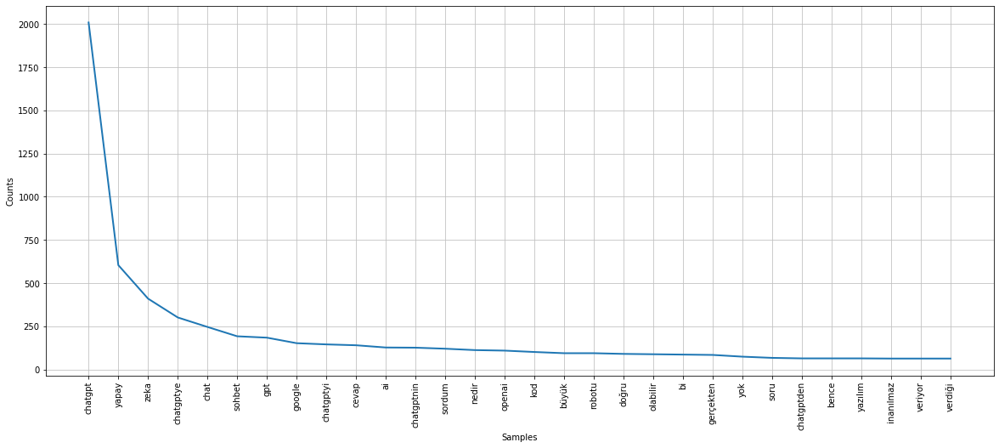

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [50]:
fdist_filtered_positive = FreqDist(token_positive_words_clean_)
plt.figure(figsize=(20, 8))
#fdist_filtered_positive.plot(30,title='POSITIVE - Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
fdist_filtered_positive.plot(30)

In [51]:
d = Counter(fdist_filtered_positive)
d.most_common(100)

[('chatgpt', 2009),
 ('yapay', 604),
 ('zeka', 410),
 ('chatgptye', 301),
 ('chat', 246),
 ('sohbet', 192),
 ('gpt', 184),
 ('google', 152),
 ('chatgptyi', 145),
 ('cevap', 140),
 ('ai', 127),
 ('chatgptnin', 126),
 ('sordum', 120),
 ('nedir', 112),
 ('openai', 109),
 ('kod', 101),
 ('büyük', 94),
 ('robotu', 94),
 ('doğru', 90),
 ('olabilir', 88),
 ('bi', 86),
 ('gerçekten', 84),
 ('yok', 74),
 ('soru', 67),
 ('chatgptden', 64),
 ('bence', 64),
 ('yazılım', 64),
 ('inanılmaz', 63),
 ('veriyor', 63),
 ('verdiği', 63),
 ('teknoloji', 60),
 ('bugün', 56),
 ('verdi', 56),
 ('olacak', 55),
 ('insan', 55),
 ('türkçe', 54),
 ('zekanın', 53),
 ('cevaplar', 53),
 ('tek', 51),
 ('istedim', 51),
 ('neler', 50),
 ('bilgi', 49),
 ('sanırım', 48),
 ('geliyor', 46),
 ('sorulara', 46),
 ('abi', 45),
 ('merak', 45),
 ('işsiz', 45),
 ('zaman', 45),
 ('sorduk', 43),
 ('cok', 42),
 ('soruyu', 41),
 ('fazla', 41),
 ('harika', 41),
 ('zekaya', 40),
 ('kullanılır', 40),
 ('gerçek', 40),
 ('kullanarak', 39),

### Word Cloud

21885


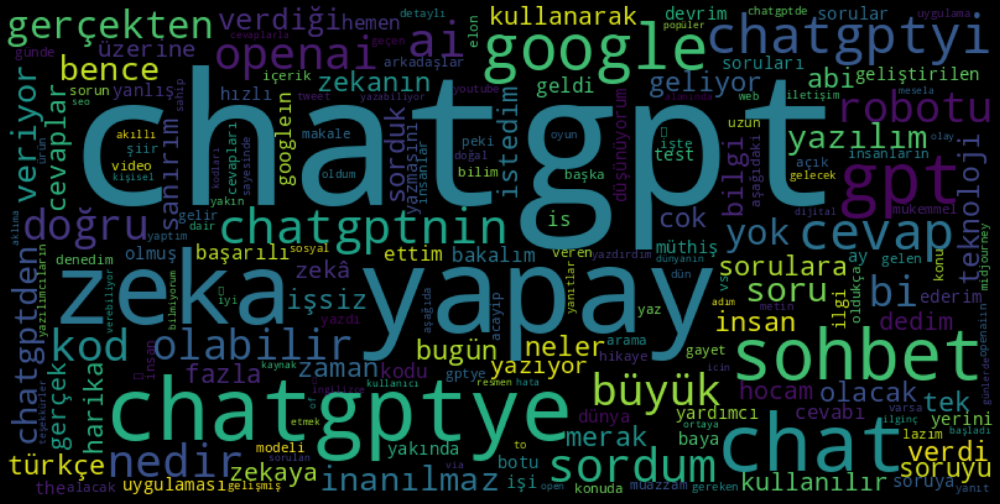

In [52]:
generate_word_cloud_from_frequencies(fdist_filtered_positive, "positive")

In [53]:
#generate_word_cloud(tweet_positive_texts_clean, "positive")

## NEGATIVE
### Tokenizer

In [54]:
token_negative_words = word_tokenize(tweet_negative_texts)
print(token_negative_words)
print(len(token_negative_words))

['Her', 'türlü', 'yazı', 'işlerimi', 'chatgpt', 'yapıyor', 'sağolsun', '.', 'Benim', 'teknolojiden', 'beklentim', 'budur', '.', 'Tembelliğime', 'çanak', 'tutsa', 'yeter', '😂', '@', 'imTolstoyevski', '2019', 'Haziran', 'bölümlerinde', 'yapay', 'zekaya', 'kısaca', 'değinmiştiniz', 'ama', 'serinin', 'odağı', 'değildi', 've', 'o', 'zamandan', 'bu', 'yana', 'üstel', 'gelişmeler', 'oldu', '.', 'ChatGPT', '’', 'ye', 'ödev', 'yaptıran', ',', 'Stable', 'Diffusion', 'ile', 'sanal', 'zaman', 'yolculuğu', 'yapanlar', 'mesela', '.', 'Bahsettiğiniz', 'temaya', 'tam', 'uyduğunu', 'düşünüyorum', '🤔', '@', 'dc_boyblue', '@', 'hellstabber', '-Konuşmaya', 'dahil', 'olduğumdan', 'dolayı', 'kusura', 'bakmayın-', 'Hayal', 'ettiğiniz', 'gibi', 'değil', 'aslında', 'sürekli', 'aynı', 'çıktıyı', 'veriyor', 've', 'ChatGPT', 'ile', 'arasında', 'resmen', '1000', 'kat', 'fark', 'var', 'ChatGPT', 'ile', 'asla', 'ama', 'asla', 'adam', 'asmaca', 'oynamayın', '.', 'ChatGPT', '’', 'nin', 'saniyeler', 'icerisinde', 'iste

### Cleaner

In [55]:
tweet_negative_texts_clean = preprocess_tweet(tweet_negative_texts)
tweet_negative_texts_clean

'her türlü yazı işlerimi chatgpt yapıyor sağolsun  benim teknolojiden beklentim budur  tembelliğime çanak tutsa yeter haziran bölümlerinde yapay zekaya kısaca değinmiştiniz ama serinin odağı değildi ve o zamandan bu yana üstel gelişmeler oldu  chatgptye ödev yaptıran  stable diffusion ile sanal zaman yolculuğu yapanlar mesela  bahsettiğiniz temaya tam uyduğunu düşünüyorum konuşmaya dahil olduğumdan dolayı kusura bakmayın hayal ettiğiniz gibi değil aslında sürekli aynı çıktıyı veriyor ve chatgpt ile arasında resmen kat fark var chatgpt ile asla ama asla adam asmaca oynamayın  chatgptnin saniyeler icerisinde istedigim kodu yazmasi sebebiyle omrumun geri kalanini doktora yapmadan da gecirebilecegim kanisina vardim  tesekkur mu etsem  kufur mu etsem  bilemedim  zamanımı alan  kendimi alamadığım yüzlerce şey varken  bir de chatgpt çıktı başıma eğer siz de cümle kurmakta zorlanan bir malsanız  bitirme tezinizi chatgpt  ye yazdırabilirsiniz mən başa düşdüyüm qədəriylə chatgpt diffusion modell

In [56]:
token_negative_words_clean = word_tokenize(tweet_negative_texts_clean)
print(token_negative_words_clean)
print(len(token_negative_words_clean))

['her', 'türlü', 'yazı', 'işlerimi', 'chatgpt', 'yapıyor', 'sağolsun', 'benim', 'teknolojiden', 'beklentim', 'budur', 'tembelliğime', 'çanak', 'tutsa', 'yeter', 'haziran', 'bölümlerinde', 'yapay', 'zekaya', 'kısaca', 'değinmiştiniz', 'ama', 'serinin', 'odağı', 'değildi', 've', 'o', 'zamandan', 'bu', 'yana', 'üstel', 'gelişmeler', 'oldu', 'chatgptye', 'ödev', 'yaptıran', 'stable', 'diffusion', 'ile', 'sanal', 'zaman', 'yolculuğu', 'yapanlar', 'mesela', 'bahsettiğiniz', 'temaya', 'tam', 'uyduğunu', 'düşünüyorum', 'konuşmaya', 'dahil', 'olduğumdan', 'dolayı', 'kusura', 'bakmayın', 'hayal', 'ettiğiniz', 'gibi', 'değil', 'aslında', 'sürekli', 'aynı', 'çıktıyı', 'veriyor', 've', 'chatgpt', 'ile', 'arasında', 'resmen', 'kat', 'fark', 'var', 'chatgpt', 'ile', 'asla', 'ama', 'asla', 'adam', 'asmaca', 'oynamayın', 'chatgptnin', 'saniyeler', 'icerisinde', 'istedigim', 'kodu', 'yazmasi', 'sebebiyle', 'omrumun', 'geri', 'kalanini', 'doktora', 'yapmadan', 'da', 'gecirebilecegim', 'kanisina', 'vardim

### Clean Stop Words

In [57]:
token_negative_words_clean_ = [w for w in token_negative_words_clean if not w in stop_words and len(w)>1]
print(token_negative_words_clean_)
print(len(token_negative_words_clean_))

['türlü', 'yazı', 'işlerimi', 'chatgpt', 'sağolsun', 'teknolojiden', 'beklentim', 'budur', 'tembelliğime', 'çanak', 'tutsa', 'yeter', 'haziran', 'bölümlerinde', 'yapay', 'zekaya', 'kısaca', 'değinmiştiniz', 'serinin', 'odağı', 'değildi', 'zamandan', 'yana', 'üstel', 'gelişmeler', 'chatgptye', 'ödev', 'yaptıran', 'stable', 'diffusion', 'sanal', 'zaman', 'yolculuğu', 'yapanlar', 'mesela', 'bahsettiğiniz', 'temaya', 'uyduğunu', 'düşünüyorum', 'konuşmaya', 'olduğumdan', 'kusura', 'bakmayın', 'hayal', 'ettiğiniz', 'sürekli', 'çıktıyı', 'veriyor', 'chatgpt', 'resmen', 'kat', 'chatgpt', 'adam', 'asmaca', 'oynamayın', 'chatgptnin', 'saniyeler', 'icerisinde', 'istedigim', 'kodu', 'yazmasi', 'sebebiyle', 'omrumun', 'kalanini', 'doktora', 'yapmadan', 'gecirebilecegim', 'kanisina', 'vardim', 'tesekkur', 'etsem', 'kufur', 'etsem', 'bilemedim', 'zamanımı', 'alan', 'kendimi', 'alamadığım', 'yüzlerce', 'varken', 'chatgpt', 'başıma', 'cümle', 'kurmakta', 'zorlanan', 'malsanız', 'bitirme', 'tezinizi', '

### Words Frequency

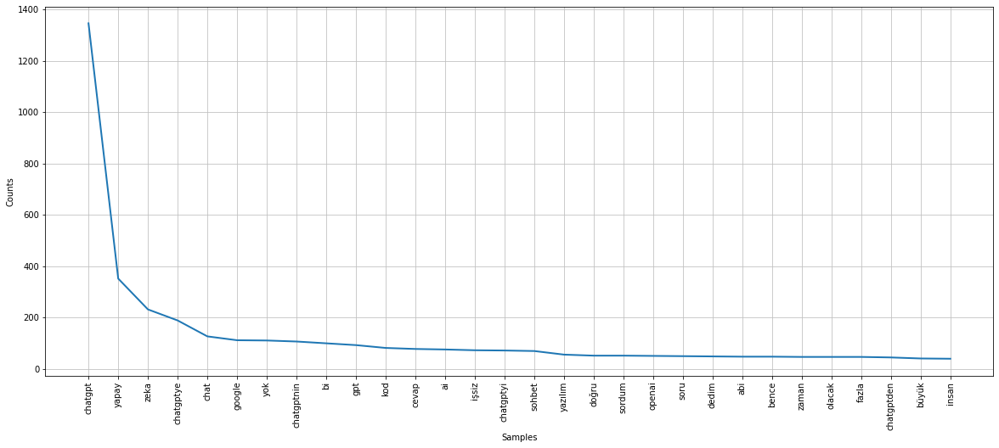

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [58]:
fdist_filtered_negative = FreqDist(token_negative_words_clean_)
plt.figure(figsize=(20, 8))
#fdist_filtered_negative.plot(30,title='NEGATIVE - Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
fdist_filtered_negative.plot(30)

In [59]:
d = Counter(fdist_filtered_negative)
d.most_common(100)

[('chatgpt', 1346),
 ('yapay', 352),
 ('zeka', 232),
 ('chatgptye', 189),
 ('chat', 127),
 ('google', 112),
 ('yok', 111),
 ('chatgptnin', 107),
 ('bi', 100),
 ('gpt', 93),
 ('kod', 82),
 ('cevap', 78),
 ('ai', 76),
 ('işsiz', 73),
 ('chatgptyi', 72),
 ('sohbet', 70),
 ('yazılım', 56),
 ('doğru', 52),
 ('sordum', 52),
 ('openai', 51),
 ('soru', 50),
 ('dedim', 49),
 ('abi', 48),
 ('bence', 48),
 ('zaman', 47),
 ('olacak', 47),
 ('fazla', 47),
 ('chatgptden', 45),
 ('büyük', 41),
 ('insan', 40),
 ('olabilir', 39),
 ('yanlış', 38),
 ('yazılımcı', 38),
 ('gerçekten', 36),
 ('yerini', 36),
 ('tek', 36),
 ('işi', 36),
 ('yazılımcılar', 35),
 ('yazdı', 35),
 ('kodu', 34),
 ('istedim', 34),
 ('denedim', 33),
 ('verdiği', 33),
 ('nedir', 33),
 ('basit', 32),
 ('veriyor', 31),
 ('vs', 31),
 ('yazılımcıların', 31),
 ('bugün', 30),
 ('verdi', 30),
 ('googleın', 30),
 ('yazılımcıları', 29),
 ('uzun', 29),
 ('yazıyor', 29),
 ('sanırım', 28),
 ('merak', 28),
 ('geldi', 28),
 ('arama', 28),
 ('teknol

### Word Cloud

21885


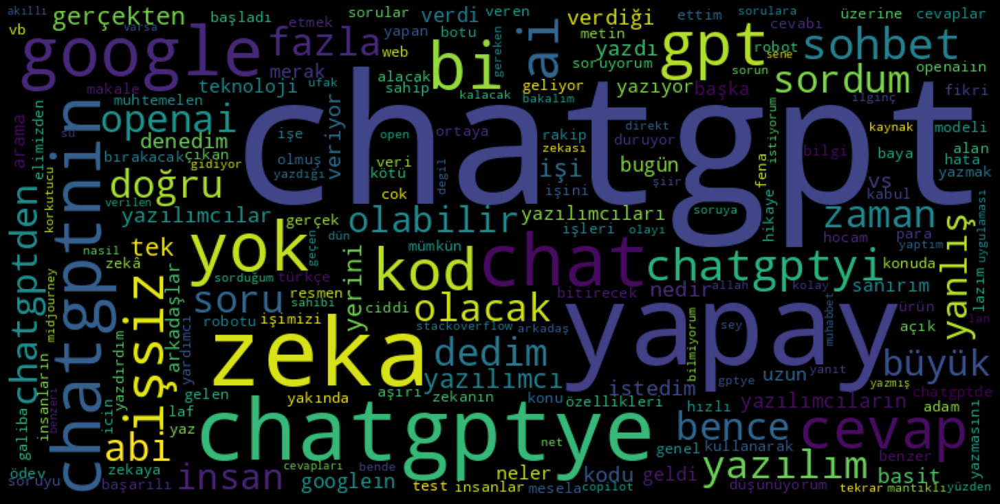

In [60]:
generate_word_cloud_from_frequencies(fdist_filtered_negative, "negative")

In [61]:
#generate_word_cloud(tweet_negative_texts_clean, "negative")

## DIFF

In [62]:
diff_only_positive = set(token_positive_words) - set(token_negative_words)
diff_only_positive

{'öpücem',
 '//t.co/bipNSMFoH8',
 'görüntüler',
 'olur.🤷\u200d♂️',
 'iman',
 'umitozdag',
 'izleyenlere',
 'azaltacak',
 'KAJSHDHKSJADHJKAAHA',
 "Oksijen'de",
 '//t.co/pYsKFV0JbD',
 'Bilal',
 'karıştırma',
 'hediye',
 'çizebiliriz',
 '//t.co/VcWMPNEsTl',
 'cevapsız',
 'anlatiyor',
 'Dipnot',
 'sağlayabiliyomuşsunuz…',
 'Bonus',
 'England',
 'kurabilmesi',
 'bilmeceleri',
 'aylar',
 'şüphecileri',
 'mühendislerin',
 'Malta',
 '//t.co/Q7nLooTlXB',
 '//t.co/0G8o5NKMR7',
 '📌1',
 'ismimi',
 'IOT',
 'sakızdaki',
 'bağlam',
 'kazıklayan',
 'yazamadıktan',
 'girenlerin',
 '//t.co/xWlGQ4bjKs',
 'coşan',
 'fikirlerle',
 '//t.co/AXT6rtcczq',
 'Etiketleyerek',
 '//t.co/24sE9kUCkN',
 'Devler',
 'bahsedilmemişti',
 'hallederim',
 'varsa…https',
 '//t.co/8VaoMa8Ybq',
 'Tweetimi',
 'heyecanlandırır',
 '//t.co/n17UnHADFX',
 'yoq',
 'BRCA1',
 'uyoruz',
 'karakterlerle',
 'DRNYAPI',
 '//t.co/k3IpAB2GIH',
 '//t.co/TzumDRwJCk',
 '//t.co/8lB0UGuxEe',
 'heyecanı',
 'silahıyla',
 '//t.co/PydAwAvGpn',
 'vefat'

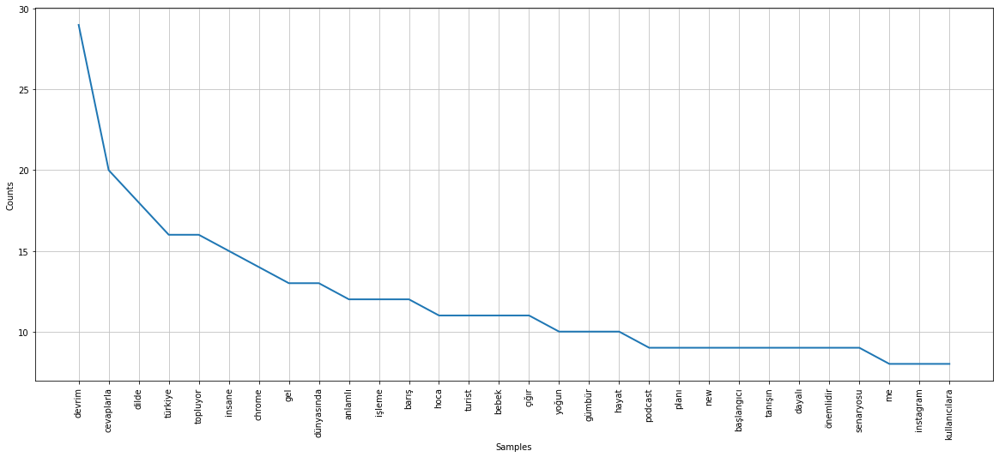

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [63]:
only_positive = []
for positive_word in token_positive_words_clean_:
  if positive_word in diff_only_positive:
    only_positive.append(positive_word)


fdist_filtered_only_positive = FreqDist(only_positive)
plt.figure(figsize=(20, 8))
fdist_filtered_only_positive.plot(30)

In [64]:
d = Counter(only_positive)
d.most_common(100)

[('devrim', 29),
 ('cevaplarla', 20),
 ('dilde', 18),
 ('türkiye', 16),
 ('topluyor', 16),
 ('insane', 15),
 ('chrome', 14),
 ('gel', 13),
 ('dünyasında', 13),
 ('anlamlı', 12),
 ('işleme', 12),
 ('barış', 12),
 ('hoca', 11),
 ('turist', 11),
 ('bebek', 11),
 ('çığır', 11),
 ('yoğun', 10),
 ('gümbür', 10),
 ('hayat', 10),
 ('podcast', 9),
 ('planı', 9),
 ('new', 9),
 ('başlangıcı', 9),
 ('tanışın', 9),
 ('dayalı', 9),
 ('önemlidir', 9),
 ('senaryosu', 9),
 ('me', 8),
 ('instagram', 8),
 ('kullanıcılara', 8),
 ('dinlemek', 8),
 ('eticaret', 8),
 ('sürecini', 8),
 ('yahu', 8),
 ('my', 8),
 ('apple', 8),
 ('derim', 8),
 ('code', 8),
 ('deneyen', 8),
 ('haklı', 8),
 ('konuşulan', 8),
 ('baba', 7),
 ('yolunda', 7),
 ('bilmeniz', 7),
 ('söylüyorum', 7),
 ('how', 7),
 ('sanatsal', 7),
 ('bırakıyorum', 7),
 ('fazlası', 7),
 ('robotudur', 7),
 ('videoda', 7),
 ('sözleşme', 7),
 ('niteliğinde', 7),
 ('devrimin', 7),
 ('çağın', 7),
 ('helal', 7),
 ('hayatımızı', 6),
 ('dilini', 6),
 ('vuran', 6),

21885


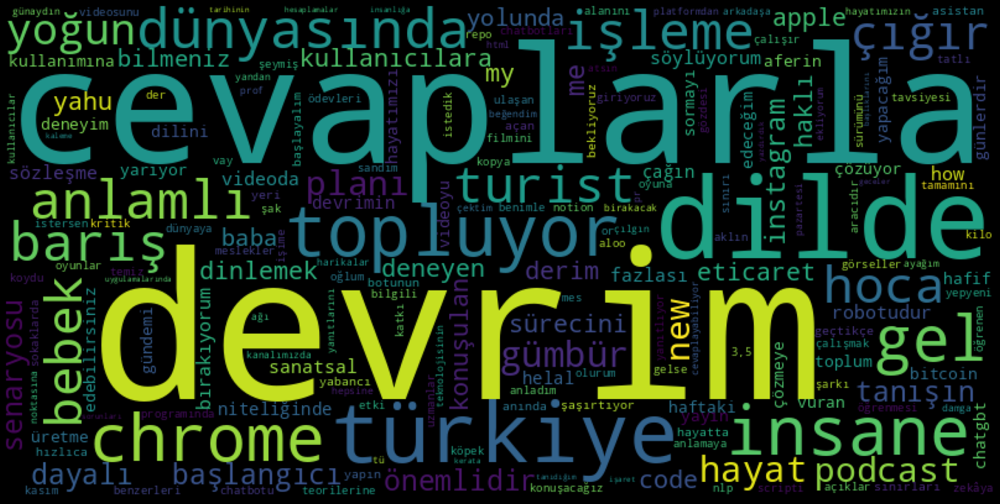

In [65]:
generate_word_cloud_from_frequencies(fdist_filtered_only_positive, "only_positive")

In [66]:
diff_only_negative = set(token_negative_words) - set(token_positive_words)
diff_only_negative

{'bilginize',
 'bypass',
 'izahlı',
 'edemeyeceğini',
 'tokat',
 'karmaşığa',
 'Cenap',
 'dataya',
 'Dilan',
 'trainerı',
 'alanindan',
 'itici',
 'çeyrek',
 'ssi',
 '//t.co/JvwNkFIabc',
 'ussal',
 '2D',
 'nacizane',
 'kullanabilmesi',
 'codequeenn',
 'siyonizmi',
 "Say'ın",
 '//t.co/zn6Y5l27Rb',
 'yürürler',
 '87d',
 'girişimi',
 'edemeyecekleri',
 'kırıp',
 'sinirleniyorum',
 'cahillik',
 'götü',
 'iletken',
 'bizimkilerden',
 'karakterin',
 'istemiyor',
 'Yavrum',
 'gormedigimi',
 '//t.co/I63Uhe6yVx',
 "dev'lerin",
 'torbayla',
 'çünki',
 'açıklamasına',
 'eğitilmişi',
 '//t.co/mOZwi3VSve',
 '8⃣',
 'aliyorlar',
 'değişir',
 'manken',
 'Başkaları',
 'edinilmesi',
 '3️⃣',
 'uygullamanın',
 'feyyaz',
 'neçə',
 'Emrin',
 'akademiyi',
 'dogrusunu',
 'akışa',
 'Abartmaya',
 '💭',
 'rakıyı',
 '-Konuşmaya',
 'bişiyden',
 'gidici',
 'freelancer',
 'takılırım',
 'elimizi',
 'Wiki',
 'tasvirini',
 'güvenmemesini',
 'kişilik',
 'Seyahâtleri',
 'Muhammed',
 'olacaktı',
 'ERC20',
 'olmayacakmış',


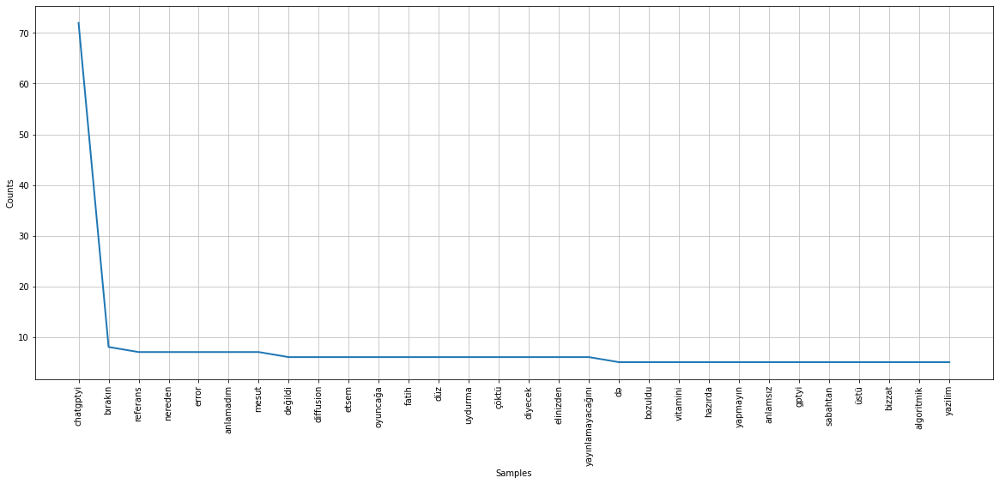

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [67]:
only_negative = []
for negative_word in token_negative_words_clean_:
  if negative_word in diff_only_negative:
    only_negative.append(negative_word)


fdist_filtered_only_negative = FreqDist(only_negative)
plt.figure(figsize=(20, 8))
fdist_filtered_only_negative.plot(30)

In [68]:
d = Counter(only_negative)
d.most_common(30)

[('chatgptyi', 72),
 ('bırakın', 8),
 ('referans', 7),
 ('nereden', 7),
 ('error', 7),
 ('anlamadım', 7),
 ('mesut', 7),
 ('değildi', 6),
 ('diffusion', 6),
 ('etsem', 6),
 ('oyuncağa', 6),
 ('fatih', 6),
 ('düz', 6),
 ('uydurma', 6),
 ('çöktü', 6),
 ('diyecek', 6),
 ('elinizden', 6),
 ('yayınlamayacağını', 6),
 ('də', 5),
 ('bozuldu', 5),
 ('vitamini', 5),
 ('hazırda', 5),
 ('yapmayın', 5),
 ('anlamsız', 5),
 ('gptyi', 5),
 ('sabahtan', 5),
 ('üstü', 5),
 ('bizzat', 5),
 ('algoritmik', 5),
 ('yazilim', 5)]

21885


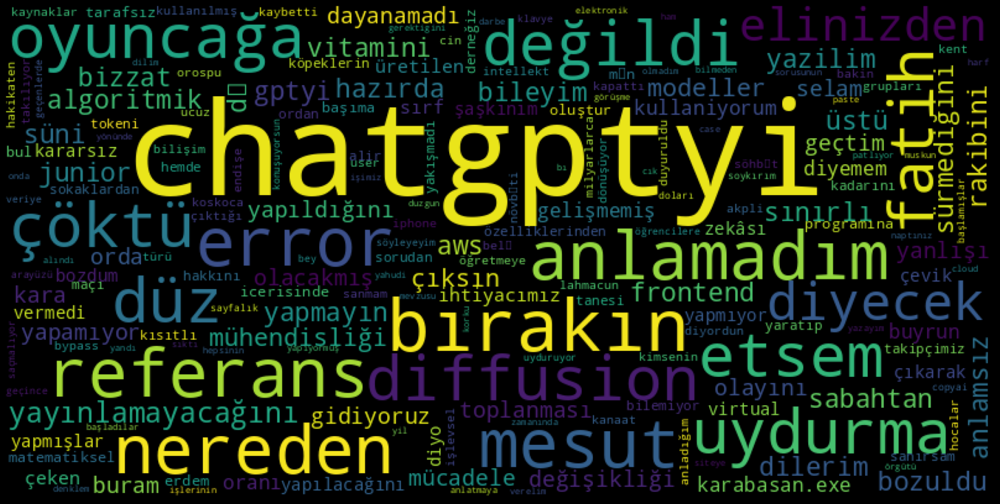

In [69]:
generate_word_cloud_from_frequencies(fdist_filtered_only_negative, "only_negative")

## CONTAINS

In [72]:
df_filter = df[df["Tweet"].str.contains("karabasan.exe")]
df_filter

,Unnamed: 0,ID,Date,Username,Tweet,ReplyCount,RetweetCount,LikeCount,QuoteCount,URL,OnlyDate
1123,1125,1605134499142057985,2022-12-20 09:34:21+00:00,turgaybuyukalp,Biz karabasan.exe ile büyüdük. Chat GPT'ye şaş...,0,0,0,0,https://twitter.com/turgaybuyukalp/status/1605...,2022-12-20
5063,5069,1599380711282077696,2022-12-04 12:30:51+00:00,mertazatt,"Ne ChatGpt'si, karabasan.exe'den devam https:/...",0,0,2,0,https://twitter.com/mertazatt/status/159938071...,2022-12-04
5321,5327,1599031770535456768,2022-12-03 13:24:17+00:00,ardadev,"ChatGPT'den önce, liseliler de, muhtemelen mev...",20,24,552,16,https://twitter.com/ardadev/status/15990317705...,2022-12-03


In [73]:
df_filter[df_filter.index==1123].Tweet.item()

"Biz karabasan.exe ile büyüdük. Chat GPT'ye şaşırmamamız bundandır."

## INTERSECTION

In [74]:
negative_and_positive = set(token_negative_words) - set(diff_only_negative)
negative_and_positive

{'kullanmamak',
 'anlamıyo',
 'tarihteki',
 'yuzunden',
 'öne',
 'dakikalık',
 'kullanabilir',
 'kafayı',
 'arkadaşı',
 'geldik',
 'ayıklama',
 'tahmin',
 'günlerin',
 'almayı',
 'zekânın',
 'onlarca',
 "ChatGPT'yi",
 'aldığı',
 'yazılımcılar',
 'GPT',
 'Siz',
 'satis',
 'Ciddi',
 'yaş',
 'yapabilirim',
 'mütevazi',
 'sahip',
 'kullanıcıya',
 'baydı',
 'iptal',
 'sohbetinin',
 'komut',
 'Hepsi',
 'buluyor',
 '⬇️',
 'magazin',
 'bilimciler',
 'geliştirilmiş',
 'Zekaya',
 'Bununla',
 'anlatmasını',
 'dersi',
 'alıyorum',
 'miymiş',
 'bilimsel',
 'motorları',
 'değiştirdi',
 "KPSS'ye",
 '2-3',
 'yeme',
 'kadarı',
 'kullanımım',
 'hedefi',
 'miyim',
 'sınav',
 'yarıda',
 'çıkarmış',
 'almaya',
 'karşıya',
 'okusun',
 'yuvarlak',
 'yapabileceğini',
 'Yarın',
 'Devrimi',
 'kimin',
 'oferhatzabun',
 'evi',
 'geride',
 '😊',
 'ı',
 'Bilim',
 'kazanan',
 'once',
 'bot',
 'ilk',
 '3.5',
 'generator',
 'yemin',
 'çöp',
 'muhafaza',
 'sardı',
 'diye',
 'ekşisözlük',
 'sahibim',
 'BorsaIstanbul',
 '

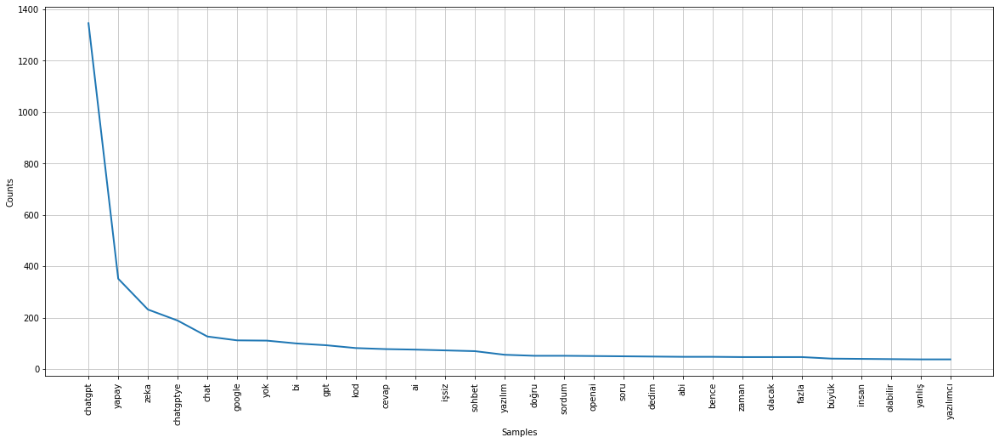

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [75]:
negative_and_positive_array = []
for negative_word in token_negative_words_clean_:
  if negative_word in negative_and_positive:
    negative_and_positive_array.append(negative_word)


fdist_filtered_negative_and_positive = FreqDist(negative_and_positive_array)
plt.figure(figsize=(20, 8))
fdist_filtered_negative_and_positive.plot(30)

In [76]:
d = Counter(negative_and_positive_array)
d.most_common(100)

[('chatgpt', 1346),
 ('yapay', 352),
 ('zeka', 232),
 ('chatgptye', 189),
 ('chat', 127),
 ('google', 112),
 ('yok', 111),
 ('bi', 100),
 ('gpt', 93),
 ('kod', 82),
 ('cevap', 78),
 ('ai', 76),
 ('işsiz', 73),
 ('sohbet', 70),
 ('yazılım', 56),
 ('doğru', 52),
 ('sordum', 52),
 ('openai', 51),
 ('soru', 50),
 ('dedim', 49),
 ('abi', 48),
 ('bence', 48),
 ('zaman', 47),
 ('olacak', 47),
 ('fazla', 47),
 ('büyük', 41),
 ('insan', 40),
 ('olabilir', 39),
 ('yanlış', 38),
 ('yazılımcı', 38),
 ('gerçekten', 36),
 ('yerini', 36),
 ('tek', 36),
 ('işi', 36),
 ('yazılımcılar', 35),
 ('yazdı', 35),
 ('kodu', 34),
 ('istedim', 34),
 ('denedim', 33),
 ('verdiği', 33),
 ('nedir', 33),
 ('basit', 32),
 ('veriyor', 31),
 ('vs', 31),
 ('yazılımcıların', 31),
 ('bugün', 30),
 ('verdi', 30),
 ('yazılımcıları', 29),
 ('uzun', 29),
 ('yazıyor', 29),
 ('sanırım', 28),
 ('merak', 28),
 ('geldi', 28),
 ('arama', 28),
 ('teknoloji', 28),
 ('neler', 28),
 ('başka', 27),
 ('arkadaşlar', 27),
 ('düşünüyorum', 2